# Exploring collaboration among Top actors/ actresses of 2020-2024

# **Data Collection**

The data files (*title.basics.tsv* and *name.basics.tsv*) can be downloaded from the links under the **Materials and Methods** section in our report.

In [ ]:
import pandas as pd
import networkx as nx
import pickle
import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import nltk
from nltk.probability import FreqDist
import os
from wordcloud import WordCloud
from collections import defaultdict
import math
import matplotlib.pyplot as plt



In [ ]:
import gzip
import shutil
import os
import numpy as np

In [ ]:
input_file = 'title.basics.tsv.gz'
output_file = '/content/title.basics.tsv'

# Uncompress the file
with gzip.open(input_file, 'rb') as f_in:
    with open(output_file, 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)

print(f"Uncompressed to {output_file}")
print(os.listdir())

In [ ]:
actors_df = pd.read_csv('/content/name.basics.tsv', sep='\t')

In [ ]:
actors_df.head()

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","tt0050419,tt0072308,tt0053137,tt0027125"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","tt0037382,tt0075213,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,music_department,producer","tt0057345,tt0049189,tt0056404,tt0054452"
3,nm0000004,John Belushi,1949,1982,"actor,writer,music_department","tt0072562,tt0077975,tt0080455,tt0078723"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0050986,tt0069467,tt0050976,tt0083922"


In [ ]:
len(actors_df)

13944218

In [ ]:
movies_df = pd.read_csv('/content/title.basics.tsv', sep='\t')

<ipython-input-13-1a4cb01db730>:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  movies_df = pd.read_csv('/content/title.basics.tsv', sep='\t')


In [ ]:
movies_df.head()

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short"
2,tt0000003,short,Poor Pierrot,Pauvre Pierrot,0,1892,\N,5,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short"


In [ ]:
len(movies_df)

11253052

Focus on top actors/ actresses of 2024-2024

https://www.the-numbers.com/box-office-star-records/domestic/yearly-acting/highest-grossing-2024-stars

In [ ]:
import requests
from bs4 import BeautifulSoup

year = 2020
base_url = f"https://www.the-numbers.com/box-office-star-records/domestic/yearly-acting/highest-grossing-{year}-stars"

# Function to scrape a single page
def scrape_page(page_url):
    headers = {
          "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/114.0.0.0 Safari/537.36"
    }
    response = requests.get(page_url, headers = headers)
    response.raise_for_status()  # Check for request errors
    soup = BeautifulSoup(response.text, 'html.parser')

    # Locate the table containing the data
    divs = soup.find_all("div", id="page_filling_chart")
    if not divs:
        print("No divs with id 'page_filling_chart' found")
        return []

    div = divs[2]

    table = div.find("table")
    if not table:
        print("No table found inside div with id 'page_filling_chart'")
        return []


    data = []

    # Iterate over table rows (skip the header row)
    for row in table.find_all("tr")[1:]:
        cols = row.find_all("td")

        rank = cols[0].text.strip()
        name = cols[1].text.strip()
        star_score = cols[2].text.strip()
        movies_count = cols[3].text.strip()
        avg_billing = cols[4].text.strip()

        # Append row data to list
        data.append({
            "Rank": rank,
            "Name": name,
            "Star Score": star_score,
            "Movies Count": movies_count,
            "Average Billing": avg_billing
        })
    return data

all_data = []
index = 1

while year <= 2024:
    page_url = f"{base_url}/{index}"
    page_data = scrape_page(page_url)

    # Break the loop if no data is returned (last page reached)
    if not page_data:
        year += 1
        index = 1
        continue

    print(f"Scraping actors/actresses starting from index {index} for year {year}")
    all_data.extend(page_data)
    index += 100

df = pd.DataFrame(all_data)
print(df.head())

Scraping actors/actresses starting from index 1 for year 2020
Scraping actors/actresses starting from index 101 for year 2020
Scraping actors/actresses starting from index 201 for year 2020
Scraping actors/actresses starting from index 301 for year 2020
Scraping actors/actresses starting from index 401 for year 2020
Scraping actors/actresses starting from index 501 for year 2020
No table found inside div with id 'page_filling_chart'
Scraping actors/actresses starting from index 1 for year 2021
Scraping actors/actresses starting from index 101 for year 2021
Scraping actors/actresses starting from index 201 for year 2021
No divs with id 'page_filling_chart' found
Scraping actors/actresses starting from index 1 for year 2022
Scraping actors/actresses starting from index 101 for year 2022
Scraping actors/actresses starting from index 201 for year 2022
Scraping actors/actresses starting from index 301 for year 2022
Scraping actors/actresses starting from index 401 for year 2022
Scraping act

In [ ]:
df.to_csv("highest_grossing_actors.csv", index=False)

In [ ]:
len(df)

2624

In [ ]:
top_actors_df = pd.read_csv('/content/highest_grossing_actors.csv')
top_actors_df.head()

,Rank,Name,Star Score,Movies Count,Average Billing
0,1,Samuel L. Jackson,367,5,7.0
1,2,Josh Brolin,338,4,8.8
2,3,Chadwick Boseman,316,4,10.8
3,4,Dwayne Johnson,305,4,1.0
4,5,Chris Hemsworth,301,4,2.0


In [ ]:
len(top_actors_df)

2905

In [ ]:
# find unique actor names
unique_names = top_actors_df['Name'].unique()
print(len(unique_names))

581


# **Data Cleaning/ Preprocessing**

In [ ]:
actors_missing_values = actors_df.isnull().sum()
print(actors_missing_values)

nconst               0
primaryName          9
birthYear            0
deathYear            0
primaryProfession    0
knownForTitles       0
dtype: int64


*Remove actor(s) that don't have primary name*

In [ ]:
actors_df.dropna(subset=['primaryName'], inplace=True)

In [ ]:
movies_missing_values = movies_df.isnull().sum()
print(movies_missing_values)

tconst              0
titleType           0
primaryTitle       19
originalTitle      19
isAdult             0
startYear           0
endYear             0
runtimeMinutes      0
genres            633
dtype: int64


In [ ]:
movies_df.dropna(subset=['primaryTitle'], inplace=True)

In [ ]:
top_actors_names = top_actors_df['Name'].tolist()

In [ ]:
actors_df = actors_df[actors_df['primaryName'].isin(top_actors_names)]
len(actors_df)

2445

*remove duplicates in actors_df with invalid birth year*

In [ ]:
duplicate_actors = actors_df[actors_df.duplicated(subset=['primaryName'], keep=False)]
duplicate_actors

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
119,nm0000120,Jim Carrey,1962,\N,"actor,writer,producer","tt0338013,tt0109040,tt0110475,tt0315327"
123,nm0000124,Jennifer Connelly,1970,\N,"actress,producer,soundtrack","tt0268978,tt0315983,tt0286716,tt0180093"
139,nm0000140,Michael Douglas,1944,\N,"actor,producer,director","tt1291580,tt0094291,tt0088011,tt0093010"
147,nm0000148,Harrison Ford,1942,\N,"actor,writer,producer","tt0082971,tt0076759,tt0106977,tt0090329"
150,nm0000151,Morgan Freeman,1937,\N,"actor,producer,director","tt0114369,tt0097239,tt0405159,tt0468569"
...,...,...,...,...,...,...
13921793,nm9967351,Steve Harris,\N,\N,"actor,composer",\N
13925327,nm9971558,Chris Evans,\N,\N,editorial_department,tt0233023
13926087,nm9972450,Chris Pratt,\N,\N,"costume_department,sound_department",tt8700608
13937186,nm9985479,Chris Pratt,\N,\N,actor,tt4575576


In [ ]:
duplicate_names = actors_df[actors_df["primaryName"].duplicated(keep=False)]["primaryName"].unique()
print(duplicate_names)
print(len(duplicate_names))

['Jim Carrey' 'Jennifer Connelly' 'Michael Douglas' 'Harrison Ford'
 'Morgan Freeman' 'Whoopi Goldberg' 'Tom Hanks' 'Milla Jovovich'
 'Jennifer Lopez' 'Will Smith' 'Sylvester Stallone' 'Mark Wahlberg'
 'Denzel Washington' 'Bruce Willis' 'Alec Baldwin' 'Candice Bergen'
 'Michael Caine' 'Cher' 'Anthony Daniels' 'Danny DeVito' 'Robert Duvall'
 'Andy Garcia' 'Hugh Grant' 'Mark Hamill' 'Don Johnson' 'Michael Keaton'
 'Helen Mirren' 'Nick Nolte' 'Dennis Quaid' 'John C. Reilly'
 'Jason Bateman' 'Kathy Bates' 'Adam Sandler' 'Richard E. Grant'
 'Martin Lawrence' 'Elizabeth McGovern' 'Guy Pearce' 'Rosie Perez'
 'Christopher Plummer' 'Maggie Smith' 'Will Ferrell' 'Anne Hathaway'
 'Vin Diesel' 'Jennifer Garner' 'Steve Harris' 'Katie Holmes'
 'Thomas Jane' 'Leslie Mann' 'Elisabeth Moss' 'Ryan Reynolds'
 'Sam Rockwell' 'Julia Stiles' 'Kate Walsh' 'Amy Adams' 'Pedro Pascal'
 'Ike Barinholtz' 'Jack Black' 'Adam Brody' 'Gerard Butler' 'Rose Byrne'
 'Jim Carter' 'Nick Castle' 'Jason Clarke' 'Bradley Coo

In [ ]:
actors_df_cleaned = actors_df[~((actors_df["primaryName"].duplicated(keep=False)) & (actors_df["birthYear"] == "\\N"))]
actors_df_cleaned

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
92,nm0000093,Brad Pitt,1963,\N,"producer,actor,executive","tt0137523,tt0356910,tt1210166,tt0114746"
109,nm0000110,Kenneth Branagh,1960,\N,"actor,producer,director","tt0097499,tt0116477,tt0107616,tt3402236"
111,nm0000112,Pierce Brosnan,1953,\N,"actor,producer,executive","tt0795421,tt0143145,tt0120347,tt0155267"
112,nm0000113,Sandra Bullock,1964,\N,"producer,actress,music_department","tt1041829,tt0212346,tt0111257,tt1454468"
119,nm0000120,Jim Carrey,1962,\N,"actor,writer,producer","tt0338013,tt0109040,tt0110475,tt0315327"
...,...,...,...,...,...,...
12861053,nm8667557,Francesca Hayward,1992,\N,"actress,soundtrack,archive_footage","tt5697572,tt0159876,tt10662310,tt25966236"
12945378,nm8773151,Eva Green,1990,\N,\N,"tt5822916,tt6521882"
12984707,nm8822933,Richie Merritt,\N,\N,"actor,soundtrack","tt4537896,tt10023022,tt14375666,tt8772296"
13147864,nm9028320,Jayden Fowora-Knight,\N,\N,actor,"tt5523010,tt1677720,tt2388771,tt6264782"


In [ ]:
len(actors_df_cleaned)

594

In [ ]:
duplicate_actors = actors_df_cleaned[actors_df_cleaned.duplicated(subset=['primaryName'], keep=False)]

# print nconst and name of duplicated actors
for index, row in duplicate_actors.iterrows():
    print(f"nconst: {row['nconst']}, name: {row['primaryName']}")

nconst: nm0000148, name: Harrison Ford
nconst: nm0000182, name: Jennifer Lopez
nconst: nm0000226, name: Will Smith
nconst: nm0000467, name: Don Johnson
nconst: nm0001230, name: Harrison Ford
nconst: nm0001602, name: Guy Pearce
nconst: nm0004996, name: Steve Harris
nconst: nm0005351, name: Ryan Reynolds
nconst: nm0005532, name: Kate Walsh
nconst: nm0010736, name: Amy Adams
nconst: nm0141697, name: Jim Carter
nconst: nm0145309, name: Nick Castle
nconst: nm0145310, name: Nick Castle
nconst: nm0164809, name: Jason Clarke
nconst: nm0177896, name: Bradley Cooper
nconst: nm0262632, name: Chris Evans
nconst: nm0262635, name: Chris Evans
nconst: nm0268199, name: Colin Farrell
nconst: nm0268200, name: Colin Farrell
nconst: nm0268958, name: Regina Hall
nconst: nm0269463, name: Jon Favreau
nconst: nm0272581, name: Rebecca Ferguson
nconst: nm0276169, name: Tom Holland
nconst: nm0356017, name: Rebecca Hall
nconst: nm0356021, name: Regina Hall
nconst: nm0362766, name: Tom Hardy
nconst: nm0362767, nam

*remove duplicates in actors_df by manually checking the profile in the-numbers.com against IMDB profile*

In [ ]:
filter_out = ['nm0810337', 'nm2265514', 'nm2289031', # Will Smith
              'nm0001230', # Harrison Ford
              'nm0268200', # Colin Farrell
              'nm0362767', # Tom Hardy
              'nm0593311', # Elizabeth Mitchell
              'nm0748621', # Paul Rudd
              'nm0788332', 'nm1365985', # Michael Shannon
              'nm0931332', # Michelle Williams
              'nm4641207', # Jennifer Lopez
              'nm0424972', 'nm1497662', # Don Johnson
              'nm0668933', # Guy Pearce
              'nm1697118', 'nm1064240', # Steve Harris
              'nm5889478', # Ryan Reynolds
              'nm7511191', # Kate Walsh
              'nm1578002', # Amy Adams
              'nm3351561', # Jim Carter
              'nm0145310', # Nick Castle
              'nm1737455', # Jason Clarke
              'nm13667167', # Bradley Cooper
              'nm0262632', 'nm1521134', # Chris Evans
              'nm0268958', # Regina Hall
              'nm0362767', # Tom Hardy
              'nm0370036', # John Hawkes
              'nm8157162', # Jon Favreau
              'nm4086321', # Rebecca Ferguson
              'nm0276169', 'nm4042070', 'nm2286597', # Tom Holland
              'nm4990685', # Rebecca Hall
              'nm0425287', 'nm2713985', 'nm8500126', # Jake Johnson
              'nm1121431', # Mandy Moore
              'nm0605078', # Tracy Morgan
              'nm0639694', # Mark O'Brien
              'nm0732946', 'nm2052382', # Nick Robinson
              'nm2004100', # Patrick Wilson
              'nm11026944', # Derrick Morgan
              'nm8773151', # Eva Green
              'nm2391093', # Gina Rodriguez

              ]

actors_df_cleaned = actors_df_cleaned[~actors_df_cleaned['nconst'].isin(filter_out)]

In [ ]:
duplicate_names = actors_df_cleaned[actors_df_cleaned.duplicated(subset=['primaryName'], keep=False)]
if duplicate_names.empty:
    print("No duplicate names found.")
else:
    print("Duplicate names found:", duplicate_names)

No duplicate names found.


In [ ]:
len(actors_df_cleaned)

549

In [ ]:
actors_df_cleaned['knownForTitles'] = actors_df_cleaned['knownForTitles'].str.split(',')
actors_df_cleaned.head()

<ipython-input-61-90af204d3157>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actors_df_cleaned['knownForTitles'] = actors_df_cleaned['knownForTitles'].str.split(',')


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
92,nm0000093,Brad Pitt,1963,\N,"producer,actor,executive","[tt0137523, tt0356910, tt1210166, tt0114746]"
109,nm0000110,Kenneth Branagh,1960,\N,"actor,producer,director","[tt0097499, tt0116477, tt0107616, tt3402236]"
111,nm0000112,Pierce Brosnan,1953,\N,"actor,producer,executive","[tt0795421, tt0143145, tt0120347, tt0155267]"
112,nm0000113,Sandra Bullock,1964,\N,"producer,actress,music_department","[tt1041829, tt0212346, tt0111257, tt1454468]"
119,nm0000120,Jim Carrey,1962,\N,"actor,writer,producer","[tt0338013, tt0109040, tt0110475, tt0315327]"


#**Initial Network Graph**

In [ ]:
# {actorId: actorName}
actorId_to_name = dict(zip(actors_df_cleaned['nconst'], actors_df_cleaned['primaryName']))
print(actorId_to_name)

{'nm0000093': 'Brad Pitt', 'nm0000110': 'Kenneth Branagh', 'nm0000112': 'Pierce Brosnan', 'nm0000113': 'Sandra Bullock', 'nm0000120': 'Jim Carrey', 'nm0000124': 'Jennifer Connelly', 'nm0000128': 'Russell Crowe', 'nm0000129': 'Tom Cruise', 'nm0000130': 'Jamie Lee Curtis', 'nm0000134': 'Robert De Niro', 'nm0000136': 'Johnny Depp', 'nm0000138': 'Leonardo DiCaprio', 'nm0000140': 'Michael Douglas', 'nm0000142': 'Clint Eastwood', 'nm0000146': 'Ralph Fiennes', 'nm0000147': 'Colin Firth', 'nm0000148': 'Harrison Ford', 'nm0000151': 'Morgan Freeman', 'nm0000155': 'Whoopi Goldberg', 'nm0000158': 'Tom Hanks', 'nm0000161': 'Salma Hayek', 'nm0000168': 'Samuel L. Jackson', 'nm0000170': 'Milla Jovovich', 'nm0000173': 'Nicole Kidman', 'nm0000179': 'Jude Law', 'nm0000182': 'Jennifer Lopez', 'nm0000185': 'Dolph Lundgren', 'nm0000190': 'Matthew McConaughey', 'nm0000191': 'Ewan McGregor', 'nm0000201': 'Michelle Pfeiffer', 'nm0000204': 'Natalie Portman', 'nm0000206': 'Keanu Reeves', 'nm0000216': 'Arnold Sch

In [ ]:
# {actorId: [movieId1, movieId2,...]}
actorId_to_movies = dict(zip(actors_df_cleaned['nconst'], actors_df_cleaned['knownForTitles']))
print(actorId_to_movies)

{'nm0000093': ['tt0137523', 'tt0356910', 'tt1210166', 'tt0114746'], 'nm0000110': ['tt0097499', 'tt0116477', 'tt0107616', 'tt3402236'], 'nm0000112': ['tt0795421', 'tt0143145', 'tt0120347', 'tt0155267'], 'nm0000113': ['tt1041829', 'tt0212346', 'tt0111257', 'tt1454468'], 'nm0000120': ['tt0338013', 'tt0109040', 'tt0110475', 'tt0315327'], 'nm0000124': ['tt0268978', 'tt0315983', 'tt0286716', 'tt0180093'], 'nm0000128': ['tt1707386', 'tt0172495', 'tt0268978', 'tt0119488'], 'nm0000129': ['tt0092099', 'tt0325710', 'tt0181689', 'tt0116695'], 'nm0000130': ['tt0111503', 'tt1502407', 'tt6710474', 'tt0077651'], 'nm0000134': ['tt0101540', 'tt0075314', 'tt0081398', 'tt0077416'], 'nm0000136': ['tt0408236', 'tt0325980', 'tt0449088', 'tt0367594'], 'nm0000138': ['tt1375666', 'tt0120338', 'tt0407887', 'tt0993846'], 'nm0000140': ['tt1291580', 'tt0094291', 'tt0088011', 'tt0093010'], 'nm0000142': ['tt0405159', 'tt1205489', 'tt0186566', 'tt0105695'], 'nm0000146': ['tt0387131', 'tt2278388', 'tt0108052', 'tt01186

In [ ]:
# {movieId: [actorId1, actorId2,...]}
movieId_to_actors = {}
for actorId, movieIds in actorId_to_movies.items():
    for movieId in movieIds:
        if movieId not in movieId_to_actors:
            movieId_to_actors[movieId] = []
        movieId_to_actors[movieId].append(actorId)

In [ ]:
# {(actorId1, actorId2): [movieId1, movieId2,...]}
actorPair_to_movies = {}
for movieId, actorIds in movieId_to_actors.items():
    for i in range(len(actorIds)):
        for j in range(i+1, len(actorIds)):
            actorId1, actorId2 = actorIds[i], actorIds[j]
            sorted_pair = tuple(sorted([actorId1, actorId2]))
            if sorted_pair not in actorPair_to_movies:
                actorPair_to_movies[sorted_pair] = []
            actorPair_to_movies[sorted_pair].append(movieId)

In [ ]:
# Initialize a graph
G = nx.Graph()

# Add edges to the graph using actor names
for (actor1_id, actor2_id), movie_ids in actorPair_to_movies.items():
    # Map IDs to names
    actor1_name = actorId_to_name.get(actor1_id, actor1_id)
    actor2_name = actorId_to_name.get(actor2_id, actor2_id)
    # Add an edge with weight and movie details
    G.add_edge(actor1_name, actor2_name, weight=len(movie_ids), movies=movie_ids)


# Example: Output graph details
print("Number of nodes (actors):", G.number_of_nodes())
print("Number of edges (collaborations):", G.number_of_edges())

# Show edges with their attributes
for u, v, data in G.edges(data=True):
    print(f"{u} - {v}: Weight = {data['weight']}, Movies = {data['movies']}")

Number of nodes (actors): 492
Number of edges (collaborations): 1110
Brad Pitt - Helena Bonham Carter: Weight = 1, Movies = ['tt0137523']
Brad Pitt - Adam Brody: Weight = 1, Movies = ['tt0356910']
Helena Bonham Carter - Russell Crowe: Weight = 1, Movies = ['tt1707386']
Helena Bonham Carter - Anne Hathaway: Weight = 1, Movies = ['tt1707386']
Helena Bonham Carter - Amanda Seyfried: Weight = 1, Movies = ['tt1707386']
Helena Bonham Carter - Eddie Redmayne: Weight = 1, Movies = ['tt1707386']
Helena Bonham Carter - Hugh Skinner: Weight = 1, Movies = ['tt1707386']
Helena Bonham Carter - Johnny Depp: Weight = 1, Movies = ['tt0408236']
Helena Bonham Carter - Colin Firth: Weight = 1, Movies = ['tt1504320']
Adam Brody - Henry Czerny: Weight = 1, Movies = ['tt7798634']
Adam Brody - Nicky Guadagni: Weight = 1, Movies = ['tt7798634']
Adam Brody - Elyse Levesque: Weight = 1, Movies = ['tt7798634']
Adam Brody - Melanie Scrofano: Weight = 1, Movies = ['tt7798634']
Adam Brody - Mark O'Brien: Weight = 1,

(-1.20837123758961,
 1.1928592146335169,
 -1.1981896960232923,
 1.1897262821786179)

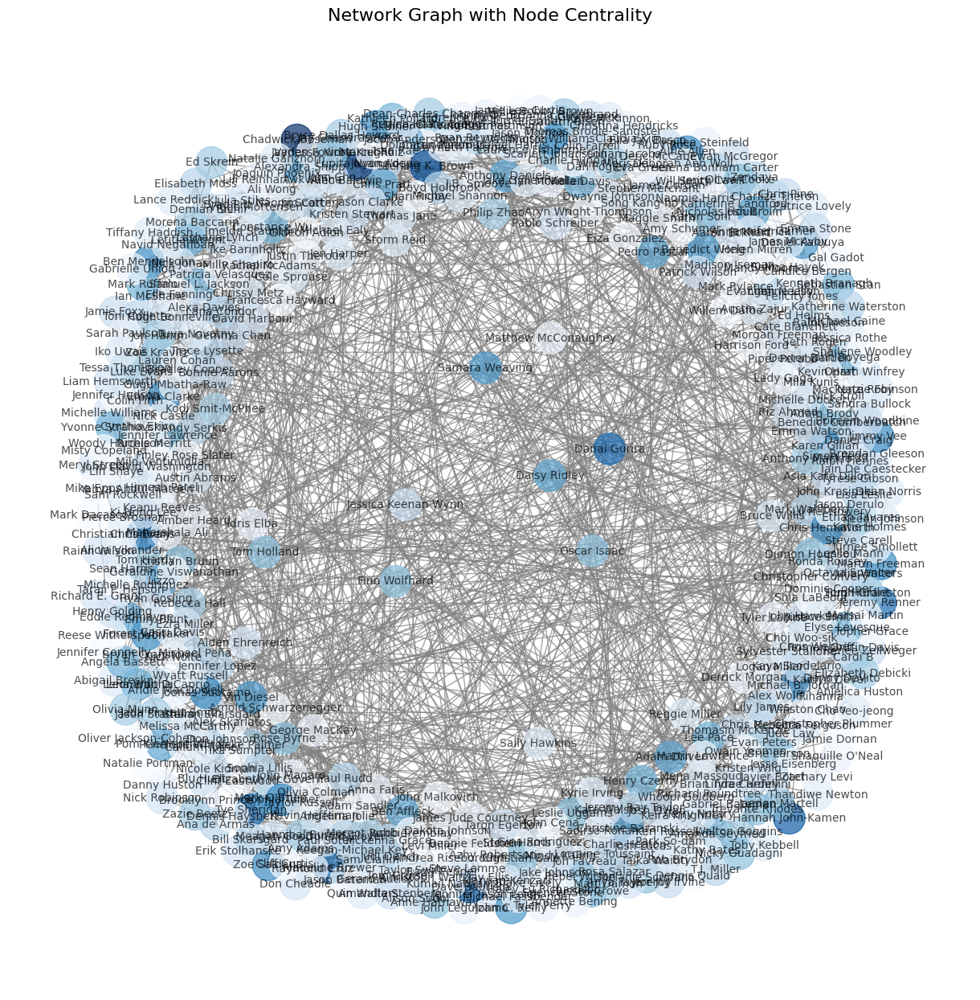

In [ ]:
import matplotlib.pyplot as plt

# Compute centrality values (e.g., degree centrality)
centrality = nx.degree_centrality(G)

# Normalize centrality values for coloring
max_c = max(centrality.values())
color_map = {node: value / max_c for node, value in centrality.items()}

# Define the spring layout for the graph
pos = nx.spring_layout(G, k=1, iterations=20)

# Draw the graph
plt.figure(figsize=(12, 12))
nx.draw(
    G,
    pos,
    node_color=list(color_map.values()),  # Node color based on centrality
    cmap=plt.cm.Blues,  # Use a blue colormap
    with_labels=True,
    font_size=10,
    node_size=800,
    edge_color='gray',
    alpha=0.7
)

# Set title and remove axes
plt.title("Network Graph with Node Centrality", fontsize=16)
plt.axis("off")

## Actor Network Graph based on Degree Centrality

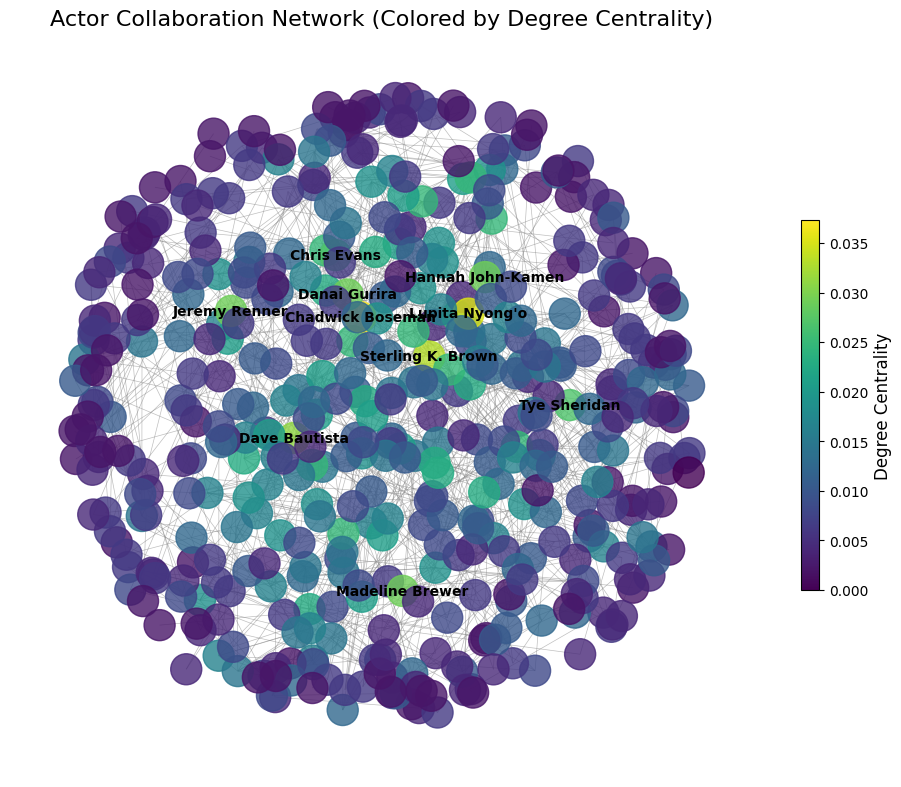

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Step 1: Compute weighted degree centrality
degree_centrality = nx.degree_centrality(G)

# Step 2: Normalize centrality values for coloring
max_centrality = max(degree_centrality.values()) if degree_centrality else 1
node_colors = [degree_centrality[node] / max_centrality for node in G.nodes()]

# Step 3: Define a dynamic threshold for labeling
threshold = 0.7 * max_centrality  # Adjust the fraction as needed
high_centrality_labels = {
    node: node for node, centrality in degree_centrality.items() if centrality >= threshold
}

# Step 4: Define graph layout
pos = nx.spring_layout(G, k=0.5, iterations=50)

# Step 5: Visualize the graph
fig, ax = plt.subplots(figsize=(12, 12))  # Create figure and axes

# Draw nodes colored by centrality
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    ax=ax,  # Associate nodes with the axes
    node_size=500,
    node_color=node_colors,
    cmap=plt.cm.viridis,  # Color map for centrality
    alpha=0.8
)

# Draw edges
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
nx.draw_networkx_edges(G, pos, ax=ax, width=0.5, edge_color="gray", alpha=0.5)

# Draw labels only for nodes with centrality above the dynamic threshold
nx.draw_networkx_labels(G, pos, labels=high_centrality_labels, font_size=10, font_color="black", font_weight="bold")

# Add a colorbar for centrality
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=mcolors.Normalize(vmin=0, vmax=max_centrality))
sm.set_array([])  # Dummy array for colorbar
cbar = fig.colorbar(sm, ax=ax, shrink=0.4)  # Explicitly associate with the figure/axes
cbar.set_label("Degree Centrality", fontsize=12)

# Ensure aspect ratio is equal for the graph
ax.set_aspect('equal')

# Add title and remove axes
ax.set_title("Actor Collaboration Network (Colored by Degree Centrality)", fontsize=16)
ax.axis("off")

# Show the graph
plt.show()


In [ ]:
degree_centrality_list = list(degree_centrality.items())
degree_centrality_list.sort(key=lambda x: x[1], reverse=True)
degree_centrality_list[:20]

[('Chadwick Boseman', 0.037267080745341616),
 ("Lupita Nyong'o", 0.035196687370600416),
 ('Sterling K. Brown', 0.033126293995859216),
 ('Dave Bautista', 0.031055900621118016),
 ('Madeline Brewer', 0.028985507246376815),
 ('Jeremy Renner', 0.028985507246376815),
 ('Danai Gurira', 0.028985507246376815),
 ('Hannah John-Kamen', 0.028985507246376815),
 ('Tye Sheridan', 0.026915113871635612),
 ('Chris Evans', 0.026915113871635612),
 ('Hugh Skinner', 0.02484472049689441),
 ('Michael B. Jordan', 0.02484472049689441),
 ('Chris Hemsworth', 0.02484472049689441),
 ('Martin Freeman', 0.02484472049689441),
 ('Joonas Suotamo', 0.02484472049689441),
 ('Jimmy Vee', 0.02484472049689441),
 ('Zoe Saldana', 0.02484472049689441),
 ('Karen Gillan', 0.02484472049689441),
 ('Alfie Allen', 0.02484472049689441),
 ('Emilia Clarke', 0.02484472049689441)]

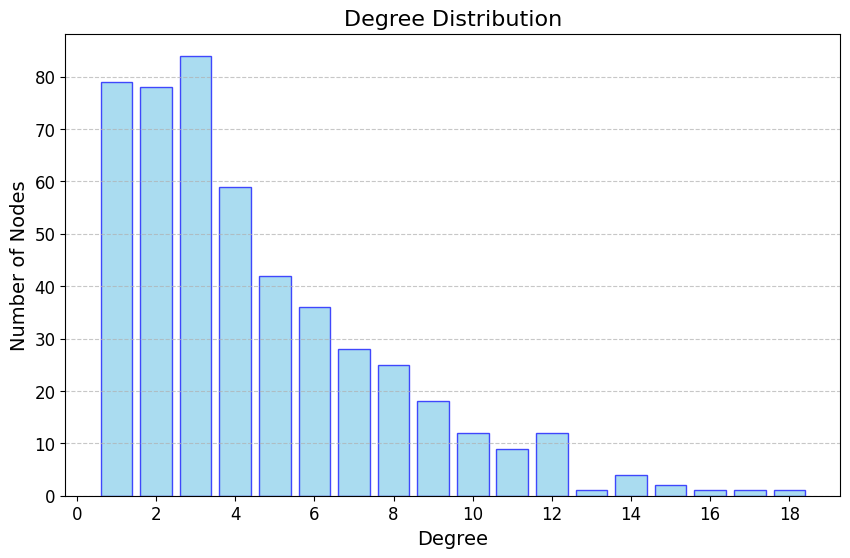

In [ ]:
import matplotlib.pyplot as plt
import collections

# Compute degrees of all nodes
degrees = [degree for node, degree in G.degree()]

# Count the frequency of each degree
degree_count = collections.Counter(degrees)

# Separate degree values and their frequencies
deg, cnt = zip(*sorted(degree_count.items()))

# Plot the degree distribution
plt.figure(figsize=(10, 6))
plt.bar(deg, cnt, width=0.8, color="skyblue", edgecolor="blue", alpha=0.7)
plt.title("Degree Distribution", fontsize=16)
plt.xlabel("Degree", fontsize=14)
plt.ylabel("Number of Nodes", fontsize=14)

# Set x-axis ticks to show only integer degrees
plt.xticks(range(0, max(deg) + 1, 2), fontsize=12)  # Customize the step size (e.g., 2)

# Add gridlines and show the plot
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


[0.16056910569105692, 0.15853658536585366, 0.17073170731707318, 0.11991869918699187, 0.08536585365853659, 0.07317073170731707, 0.056910569105691054, 0.0508130081300813, 0.036585365853658534, 0.024390243902439025, 0.018292682926829267, 0.024390243902439025, 0.0020325203252032522, 0.008130081300813009, 0.0040650406504065045, 0.0020325203252032522, 0.0020325203252032522, 0.0020325203252032522]


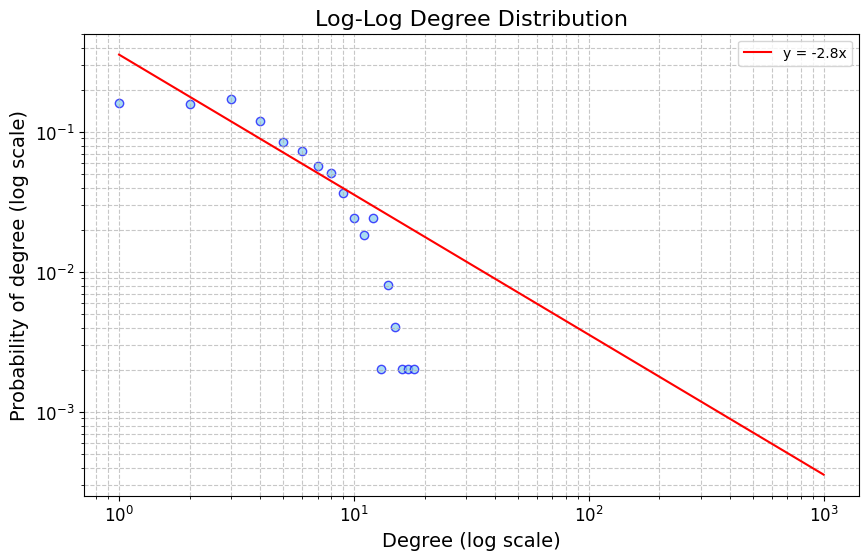

In [ ]:
# Compute degrees of all nodes
degrees = [degree for node, degree in G.degree()]

# Count the frequency of each degree
degree_count = collections.Counter(degrees)

# Separate degree values and their frequencies
deg, cnt = zip(*sorted(degree_count.items()))
cnt = [c / len(G.nodes()) for c in cnt]
print(cnt)

# Plot the degree distribution on a log-log scale
plt.figure(figsize=(10, 6))
plt.scatter(deg, cnt, color="skyblue", edgecolor="blue", alpha=0.7)
plt.xscale("log")
plt.yscale("log")

# Add labels, title, and grid
plt.title("Log-Log Degree Distribution", fontsize=16)
plt.xlabel("Degree (log scale)", fontsize=14)
plt.ylabel("Probability of degree (log scale)", fontsize=14)
plt.grid(which="both", linestyle="--", alpha=0.7)

# Customize tick sizes
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

x = np.logspace(0, 3, 100) #to adjust for log log space
y = 1 / (2.8 * x)
plt.plot(x, y, color='red', label='y = -2.8x')
plt.legend()
# Show the plot
plt.show()


## Actor Network Graph based on Closeness Centrality

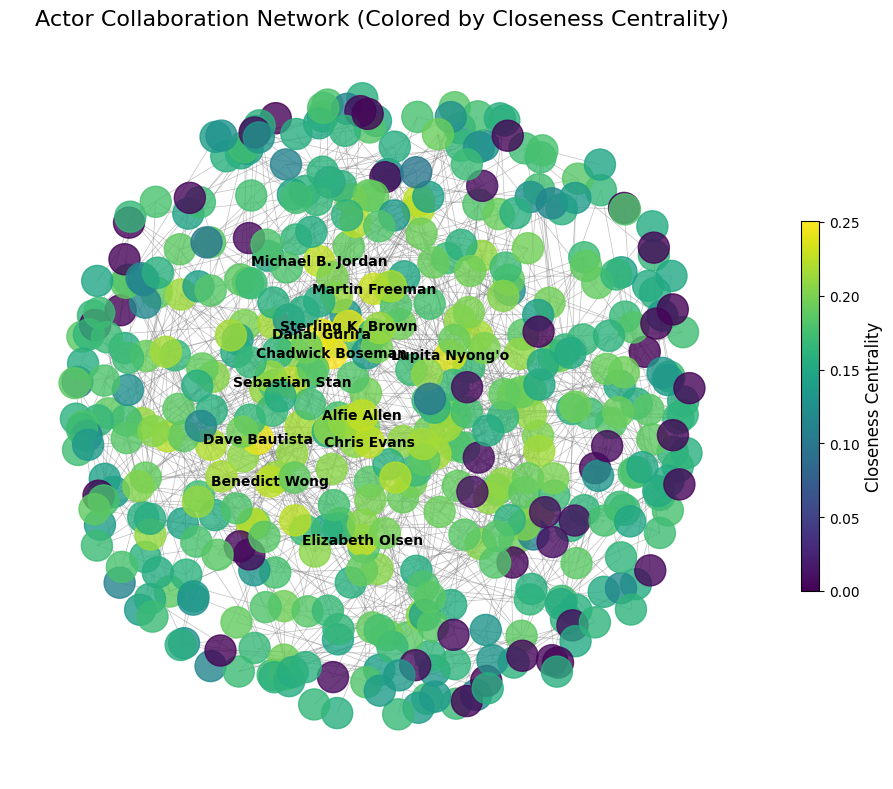

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Step 1: Compute closeness centrality
closeness_centrality = nx.closeness_centrality(G)

# Step 2: Normalize centrality values for coloring
max_centrality = max(closeness_centrality.values()) if closeness_centrality else 1
node_colors = [closeness_centrality[node] / max_centrality for node in G.nodes()]

# Step 3: Define a dynamic threshold for labeling
threshold = 0.9 * max_centrality  # Adjust the fraction as needed
high_centrality_labels = {
    node: node for node, centrality in closeness_centrality.items() if centrality >= threshold
}

# Step 4: Define graph layout
pos = nx.spring_layout(G, k=0.5, iterations=50)

# Step 5: Visualize the graph
fig, ax = plt.subplots(figsize=(12, 12))  # Create figure and axes

# Draw nodes colored by centrality
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    ax=ax,  # Associate nodes with the axes
    node_size=500,
    node_color=node_colors,
    cmap=plt.cm.viridis,  # Color map for centrality
    alpha=0.8
)

# Draw edges
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
nx.draw_networkx_edges(G, pos, ax=ax, width=0.5, edge_color="gray", alpha=0.5)

# Draw labels only for nodes with centrality above the dynamic threshold
nx.draw_networkx_labels(G, pos, labels=high_centrality_labels, font_size=10, font_color="black", font_weight="bold")

# Add a colorbar for centrality
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=mcolors.Normalize(vmin=0, vmax=max_centrality))
sm.set_array([])  # Dummy array for colorbar
cbar = fig.colorbar(sm, ax=ax, shrink=0.4)  # Explicitly associate with the figure/axes
cbar.set_label("Closeness Centrality", fontsize=12)

# Ensure aspect ratio is equal for the graph
ax.set_aspect('equal')

# Add title and remove axes
ax.set_title("Actor Collaboration Network (Colored by Closeness Centrality)", fontsize=16)
ax.axis("off")

# Show the graph
plt.show()

In [ ]:
closeness_centrality_list = list(closeness_centrality.items())
closeness_centrality_list.sort(key=lambda x: x[1], reverse=True)
closeness_centrality_list[:20]

[('Chadwick Boseman', 0.25043666241100315),
 ('Danai Gurira', 0.24101489477175422),
 ('Dave Bautista', 0.2408687365578235),
 ('Sterling K. Brown', 0.24014059648358582),
 ("Lupita Nyong'o", 0.23670592764234266),
 ('Martin Freeman', 0.22972385574543144),
 ('Elizabeth Olsen', 0.22892942166216193),
 ('Alfie Allen', 0.22748714008238885),
 ('Benedict Wong', 0.22593432683950565),
 ('Sebastian Stan', 0.22580588208291696),
 ('Michael B. Jordan', 0.2255494302009375),
 ('Chris Evans', 0.2255494302009375),
 ('Daniel Kaluuya', 0.22516584273460938),
 ('Josh Brolin', 0.22491084178021004),
 ('Pom Klementieff', 0.22440256869144123),
 ('Letitia Wright', 0.22402286891362153),
 ('Karen Gillan', 0.22364445190532148),
 ('Forest Whitaker', 0.22301658988425097),
 ('Angela Bassett', 0.2217713827938866),
 ('Emilia Clarke', 0.22115397916695487)]

## Actor Network Graph based on Betweenness Centrality

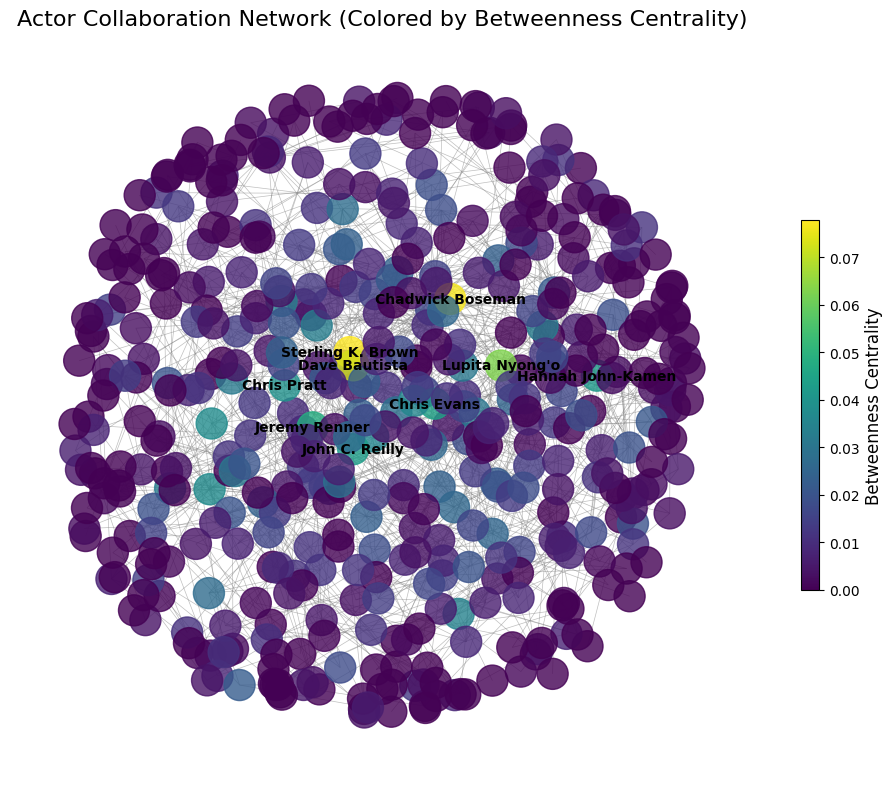

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Step 1: Compute betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

# Step 2: Normalize centrality values for coloring
max_centrality = max(betweenness_centrality.values()) if betweenness_centrality else 1
node_colors = [betweenness_centrality[node] / max_centrality for node in G.nodes()]

# Step 3: Define a dynamic threshold for labeling
threshold = 0.5 * max_centrality  # Adjust the fraction as needed
high_centrality_labels = {
    node: node for node, centrality in betweenness_centrality.items() if centrality >= threshold
}

# Step 4: Define graph layout
pos = nx.spring_layout(G, k=0.5, iterations=50)

# Step 5: Visualize the graph
fig, ax = plt.subplots(figsize=(12, 12))  # Create figure and axes

# Draw nodes colored by centrality
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    ax=ax,  # Associate nodes with the axes
    node_size=500,
    node_color=node_colors,
    cmap=plt.cm.viridis,  # Color map for centrality
    alpha=0.8
)

# Draw edges
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
nx.draw_networkx_edges(G, pos, ax=ax, width=0.5, edge_color="gray", alpha=0.5)

# Draw labels only for nodes with centrality above the dynamic threshold
nx.draw_networkx_labels(G, pos, labels=high_centrality_labels, font_size=10, font_color="black", font_weight="bold")

# Add a colorbar for centrality
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=mcolors.Normalize(vmin=0, vmax=max_centrality))
sm.set_array([])  # Dummy array for colorbar
cbar = fig.colorbar(sm, ax=ax, shrink=0.4)  # Explicitly associate with the figure/axes
cbar.set_label("Betweenness Centrality", fontsize=12)

# Ensure aspect ratio is equal for the graph
ax.set_aspect('equal')

# Add title and remove axes
ax.set_title("Actor Collaboration Network (Colored by Betweenness Centrality)", fontsize=16)
ax.axis("off")

# Show the graph
plt.show()

In [ ]:
betweenness_centrality_list = list(betweenness_centrality.items())
betweenness_centrality_list.sort(key=lambda x: x[1], reverse=True)
betweenness_centrality_list[:20]

[('Sterling K. Brown', 0.07774027866397719),
 ('Chadwick Boseman', 0.0767990447364299),
 ('Dave Bautista', 0.07260080009004945),
 ("Lupita Nyong'o", 0.06274640578700849),
 ('Jeremy Renner', 0.04800932604675857),
 ('Chris Evans', 0.044643236395330375),
 ('John C. Reilly', 0.042979419144978916),
 ('Hannah John-Kamen', 0.04185698329477448),
 ('Chris Pratt', 0.03907950101726744),
 ('Alfie Allen', 0.03755233064024259),
 ('Christine Baranski', 0.03714855441351),
 ('Emilia Clarke', 0.035891605086217276),
 ('Madeline Brewer', 0.03577052135857324),
 ('Ana de Armas', 0.034540122479660255),
 ('Vin Diesel', 0.03305800122555966),
 ('Benedict Wong', 0.033000258507779816),
 ('Martin Freeman', 0.03259824165596578),
 ('Samuel L. Jackson', 0.03202141106676238),
 ('Ben Affleck', 0.03168547441014835),
 ('Trevante Rhodes', 0.031195813995908723)]

In [ ]:
actors = [node for node in G.nodes()]
len(actors)

492

# **Network Graph Analysis**

**Graph Density**

In [ ]:
density = nx.density(G)
print("Density of the network:", density)

Density of the network: 0.009189806765684766


**Assortative Mixing (Degree Correlation)**

This measures whether nodes with similar degrees tend to connect to each other.

In [ ]:
# Degree Assortativity Coefficient
assortativity = nx.degree_assortativity_coefficient(G)
print(f"Degree Assortativity Coefficient: {assortativity}")

# Interpretation
if assortativity > 0:
    print("The network is assortative: nodes with similar degrees tend to connect.")
elif assortativity < 0:
    print("The network is disassortative: high-degree nodes connect to low-degree nodes.")
else:
    print("The network has no significant degree correlations.")

Degree Assortativity Coefficient: 0.4678787382987291
The network is assortative: nodes with similar degrees tend to connect.


**Small-World Phenomenon**

In [ ]:
import random

# Check if the graph is connected (needed for shortest path length)
if nx.is_connected(G):
    avg_shortest_path_length = nx.average_shortest_path_length(G)
    print(f"Average Shortest Path Length: {avg_shortest_path_length}")
else:
    print("The graph is not connected. Computing on the largest connected component.")
    largest_cc = max(nx.connected_components(G), key=len)
    subgraph = G.subgraph(largest_cc).copy()
    avg_shortest_path_length = nx.average_shortest_path_length(subgraph)
    print(f"Average Shortest Path Length (Largest Component): {avg_shortest_path_length}")

# Clustering Coefficient (Global)
global_clustering = nx.transitivity(G)  # Equivalent to the global clustering coefficient
print(f"Global Clustering Coefficient: {global_clustering}")

# Comparison with a random graph
N = G.number_of_nodes()
E = G.number_of_edges()
random_graph = nx.gnm_random_graph(N, E)
random_clustering = nx.transitivity(random_graph)
# Check if the random graph is connected
while not nx.is_connected(random_graph):
  random_graph = nx.gnm_random_graph(N, E)
  # print("Random graph is not connected. Computing on the largest connected component.")
random_path_length = nx.average_shortest_path_length(random_graph)
# else:
#
#     largest_cc_random = max(nx.connected_components(random_graph), key=len)
#     random_subgraph = random_graph.subgraph(largest_cc_random).copy()
#     random_path_length = nx.average_shortest_path_length(random_subgraph)

print(f"Random Graph Clustering Coefficient: {random_clustering}")
if random_path_length:
    print(f"Random Graph Average Shortest Path Length: {random_path_length}")

# Small-World Conclusion
if global_clustering > random_clustering and avg_shortest_path_length < random_path_length:
    print("The network exhibits small-world properties.")
else:
    print("The network does not exhibit small-world properties.")

The graph is not connected. Computing on the largest connected component.
Average Shortest Path Length (Largest Component): 5.378408745824476
Global Clustering Coefficient: 0.47959183673469385
Random Graph Clustering Coefficient: 0.011517478278440088
Random Graph Average Shortest Path Length: 4.310035931316543
The network does not exhibit small-world properties.


**Clustering Coefficient**

The clustering coefficient measures how well nodes form tightly-knit communities.

In [ ]:
# Average Clustering Coefficient (Local)
average_clustering = nx.average_clustering(G)
print(f"Average Clustering Coefficient: {average_clustering}")

# Sort nodes by their clustering coefficient in descending order
sorted_clustering = sorted(node_clustering.items(), key=lambda x: x[1], reverse=True)

# Filter nodes with clustering coefficient equal to 1.0
nodes_with_clustering_1 = {node: coeff for node, coeff in node_clustering.items() if coeff == 1.0}

# Print the results
print("Nodes with Clustering Coefficient of 1.0:")
for node, coeff in nodes_with_clustering_1.items():
    print(f"Node {node}: {coeff}")

Average Clustering Coefficient: 0.4132665850732211
Nodes with Clustering Coefficient of 1.0:
Node Pierce Brosnan: 1.0
Node Danny DeVito: 1.0
Node Alec Baldwin: 1.0
Node John Leguizamo: 1.0
Node Jennifer Lopez: 1.0
Node Trace Lysette: 1.0
Node Abigail Breslin: 1.0
Node Ian McShane: 1.0
Node Chris Messina: 1.0
Node Blake Lively: 1.0
Node Angela Bassett: 1.0
Node Woody Harrelson: 1.0
Node Sam Rockwell: 1.0
Node Christoph Waltz: 1.0
Node Maggie Smith: 1.0
Node Gwyneth Paltrow: 1.0
Node Imelda Staunton: 1.0
Node Milly Shapiro: 1.0
Node Nicky Guadagni: 1.0
Node Melanie Scrofano: 1.0
Node Kristian Bruun: 1.0
Node Elizabeth McGovern: 1.0
Node Jeremy Irvine: 1.0
Node Alexa Davies: 1.0
Node Jessica Keenan Wynn: 1.0
Node Josh Dylan: 1.0
Node Michael Ealy: 1.0
Node T.J. Miller: 1.0
Node Keri Russell: 1.0
Node Toby Kebbell: 1.0
Node Lin Shaye: 1.0
Node Pablo Schreiber: 1.0
Node Jon Favreau: 1.0
Node Rob Brydon: 1.0
Node Kate McKinnon: 1.0
Node Kristen Wiig: 1.0
Node Rainn Wilson: 1.0
Node John Kras

# **Text Analysis**

In [ ]:
import requests

In [ ]:
def get_wikipedia_text(name):
    # url = f"https://en.wikipedia.org/w/api.php?title={name}&action=query&prop=extracts"
    url = f"https://en.wikipedia.org/w/api.php?action=query&prop=extracts&explaintext&titles={name}&format=json"
    response = requests.get(url)

    # If request was successful
    if response.status_code == 200:
      # data = response.json()
      content = response.json()
      page = next(iter(content['query']['pages'].values()))
      if 'extract' in page:
        print("Success")
        return page['extract']
      else:
        print(name)


def assign_wikipedia_attr(G):
  pages_missing = []
  for node in G.nodes():
    wikipedia_text = get_wikipedia_text(node)
    if wikipedia_text:
      G.nodes[node]['description'] = wikipedia_text
    else:
      pages_missing.append(node)
  return pages_missing

In [ ]:
pages_missing = assign_wikipedia_attr(G)

Ethan Tavares
Deric McCabe
Kathleen Pollard
Quin Walters
Jayden Fowora-Knight
Aryn Wright-Thompson
Shari Rigby
Finley Rose Slater
Azhy Robertson
Natalie Ganzhorn


In [ ]:
# Manual Scraping
content = get_wikipedia_text("Brad Pitt")
# G.nodes['J.B. Smoove']['description'] = content
content

Success


'William Bradley Pitt (born December 18, 1963) is an American actor and film producer. He is the recipient of various accolades, including two Academy Awards, two British Academy Film Awards, two Golden Globe Awards, and a Primetime Emmy Award. One of the most influential celebrities, Pitt appeared on Forbes\' annual Celebrity 100 list  from 2006 to 2008, and the Time 100 list in 2007.\nPitt first gained recognition as a cowboy hitchhiker in the Ridley Scott road film Thelma & Louise (1991). Pitt emerged as a star taking on leading man roles in films such as the drama A River Runs Through It (1992), the western Legends of the Fall (1994), the horror film Interview with the Vampire (1994), and the crime thriller Seven (1995). Pitt found greater commercial success starring in Steven Soderbergh\'s heist film Ocean\'s Eleven (2001), and reprised his role in its sequels. He cemented his leading man status starring in blockbusters such as the historical epic Troy (2004), the romantic crime f

In [ ]:
actors_to_remove = [actor for actor in pages_missing if not G.nodes[actor] or not G.nodes[actor].get('description')]

In [ ]:
G.remove_nodes_from(actors_to_remove)

In [ ]:
# Test if descriptions are all retrieved
min([len(G.nodes[node].get("description")) for node in G.nodes()])

198

In [ ]:
with open('actor-graph-sentiment.pkl', 'rb') as f:
    G = pickle.load(f)

In [ ]:
import community.community_louvain as community_louvain

In [ ]:
# Detect communities using the Louvain algorithm
partition_louvain = community_louvain.best_partition(G)

# Calculate modularity of the partition
modularity_score_louvain = community_louvain.modularity(partition_louvain, G)
print("Modularity Score:", modularity_score_louvain)

Modularity Score: 0.7652153563156235


In [ ]:
# Calculate the average clustering coefficient for the graph
avg_clustering_coefficient = nx.average_clustering(G)
print("Average Clustering Coefficient:", avg_clustering_coefficient)

# Dictionary to track nodes in each community
community_clusters = {}
for node, community in partition_louvain.items():
    if community not in community_clusters:
        community_clusters[community] = []
    community_clusters[community].append(node)

# Dictionary to store community and its clustering coefficient
clustering_coefficients = {}

# Calculating clustering coefficient for each community
for community, nodes in community_clusters.items():
    subgraph = G.subgraph(nodes)
    clustering_coefficient = nx.average_clustering(subgraph)
    clustering_coefficients[community] = clustering_coefficient

# Sorting the clustering coefficients from highest to lowest
sorted_coefficients = sorted(clustering_coefficients.items(), key=lambda x: x[1], reverse=True)

# Display sorted results and sizes
for community, coeff in sorted_coefficients:
    community_size = len(community_clusters[community])
    print(f"Community {community}: Clustering Coefficient = {coeff}, Size = {community_size}")

Average Clustering Coefficient: 0.4132665850732211
Community 32: Clustering Coefficient = 1.0, Size = 5
Community 5: Clustering Coefficient = 1.0, Size = 4
Community 8: Clustering Coefficient = 1.0, Size = 4
Community 16: Clustering Coefficient = 1.0, Size = 4
Community 1: Clustering Coefficient = 0.7345238095238095, Size = 14
Community 10: Clustering Coefficient = 0.7313333333333334, Size = 25
Community 2: Clustering Coefficient = 0.685064935064935, Size = 14
Community 22: Clustering Coefficient = 0.6196190476190476, Size = 25
Community 25: Clustering Coefficient = 0.5977591036414567, Size = 17
Community 30: Clustering Coefficient = 0.5916666666666667, Size = 16
Community 4: Clustering Coefficient = 0.5903679653679654, Size = 22
Community 15: Clustering Coefficient = 0.5857142857142856, Size = 14
Community 0: Clustering Coefficient = 0.5784353741496598, Size = 35
Community 20: Clustering Coefficient = 0.5498535777947543, Size = 34
Community 23: Clustering Coefficient = 0.5382472137791

ANALYSING POSSIBLE ASSOCIATIONS TO COMMUNITIES USING WORD CLOUDS

In [ ]:
nltk.download("stopwords")
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words("english"))
nltk.download('punkt_tab')
nltk.download("wordnet")

def preprocess_text(text):
    # Tokenize and lowercase
    tokens = word_tokenize(text.lower())

    # Remove punctuation and stop words, then lemmatize
    tokens = [
        lemmatizer.lemmatize(word)
        for word in tokens
        if word not in stop_words and word.isalpha()
    ]
    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
def combine_community_tokens(G, partition):
    community_tokens = {}
    for node in G.nodes():
        community_id = partition[node]
        if community_id not in community_tokens:
            community_tokens[community_id] = []
        tokens = preprocess_text(G.nodes[node]['description'])
        community_tokens[community_id].extend(tokens)
    return community_tokens


In [ ]:
community_tokens = combine_community_tokens(G, partition_louvain)

In [ ]:
biggest_communities = [comm for comm, _ in FreqDist(partition_louvain.values()).most_common(10)]

In [ ]:
def compute_tf(doc):
    tf_dict = {}

    for term in doc:
      all_tokens = doc[term]
      word_counts = FreqDist(all_tokens)
      filtered_word_counts = FreqDist({
          word: count for word, count in word_counts.items() if count >= 5
      })

      # Save TF list for this genre
      tf_dict[term] = filtered_word_counts
    return tf_dict


def create_word_cloud(freq_dist, comm_name, name):
    # Create a single string with each word repeated according to its frequency
    word_string = ' '.join([word for word, freq in freq_dist.items() for _ in range(round(freq))])

    # Create a word cloud
    wordcloud = WordCloud(collocations=False, background_color='white').generate(word_string)

    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # Do not show axis
    plt.title(f"Word Cloud for {name}: {comm_name}", fontsize=20)
    plt.show()

def calculate_idf(tf_dict):
    idf = defaultdict(int)
    num_docs = len(tf_dict)  # Total number of documents (genres)

    # Count how many documents contain each word
    for genre, freq_dist in tf_dict.items():
        for word in freq_dist.keys():
            idf[word] += 1

    # Calculate IDF for each word
    for word, count in idf.items():
        idf[word] = math.log(num_docs / count) # THIS IS NATURAL LOG, DOESNT MAKE A DIFFERENCE
    return idf

def calculate_tfidfs(tf_dict, idf):

  for genre, tf in tf_dict.items():
    for word, freq in tf.items():
      tf[word] = freq * idf[word]
    tf_dict[genre] = tf

  return tf_dict

In [ ]:
tf_dict = compute_tf(community_tokens)

In [ ]:
comm_idf = calculate_idf(tf_dict)

In [ ]:
comm_tf_idf = calculate_tfidfs(tf_dict, comm_idf)

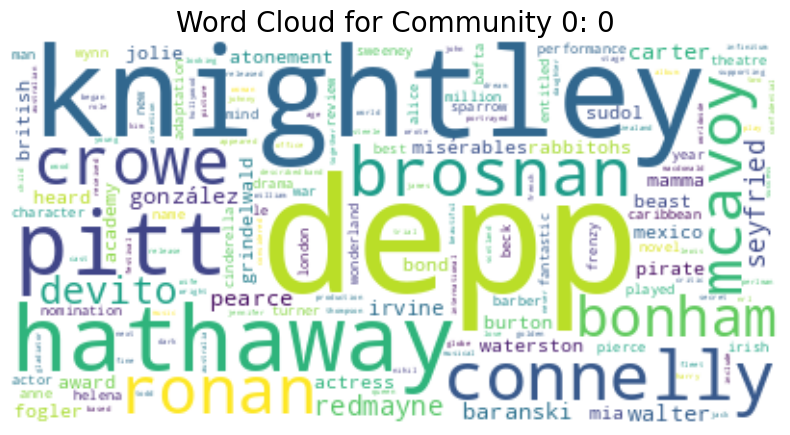

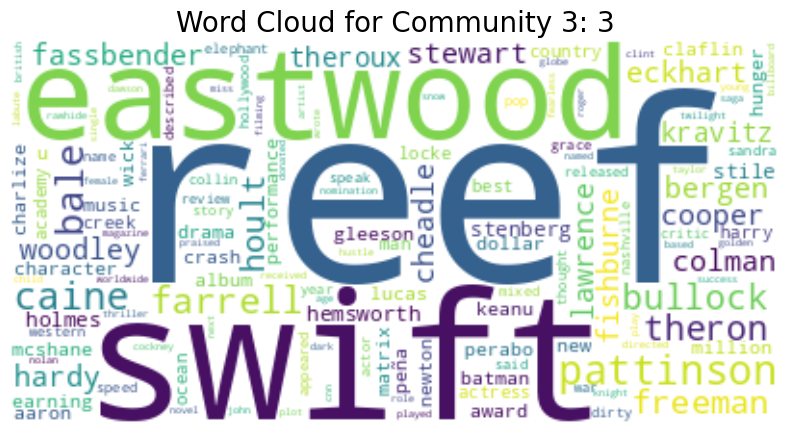

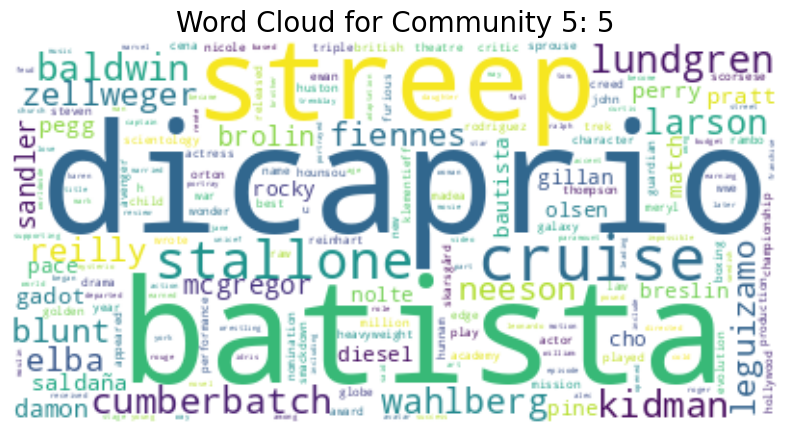

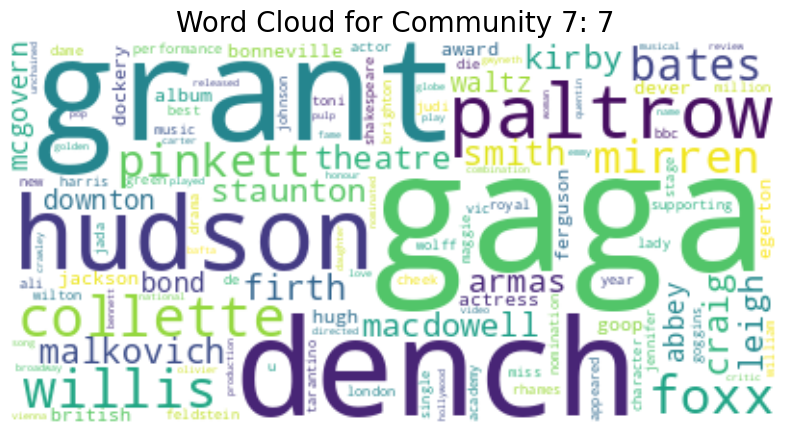

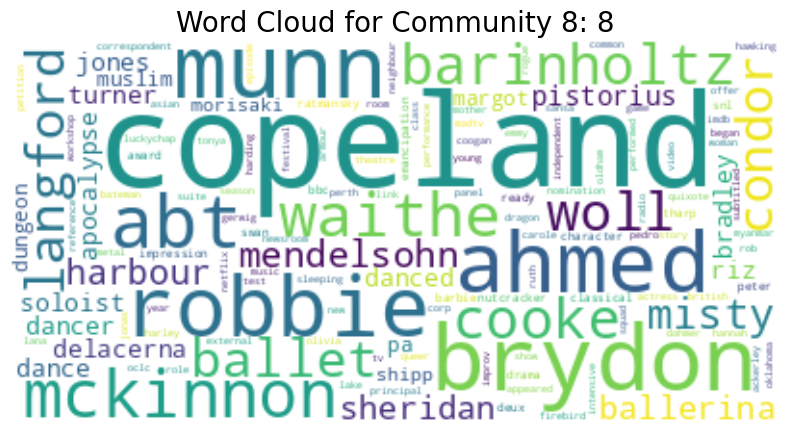

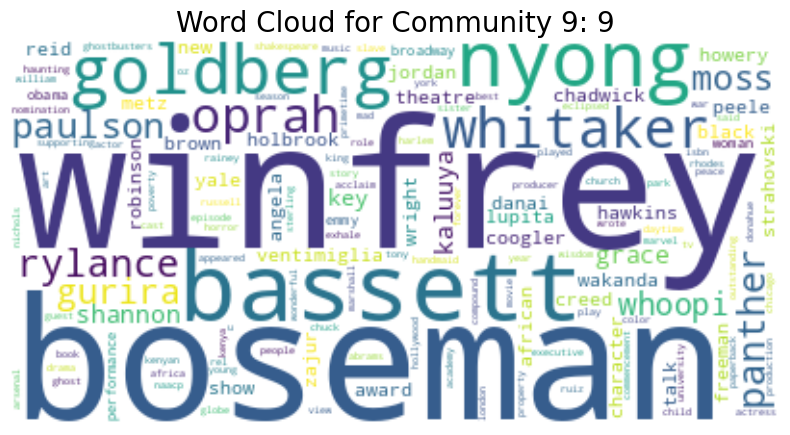

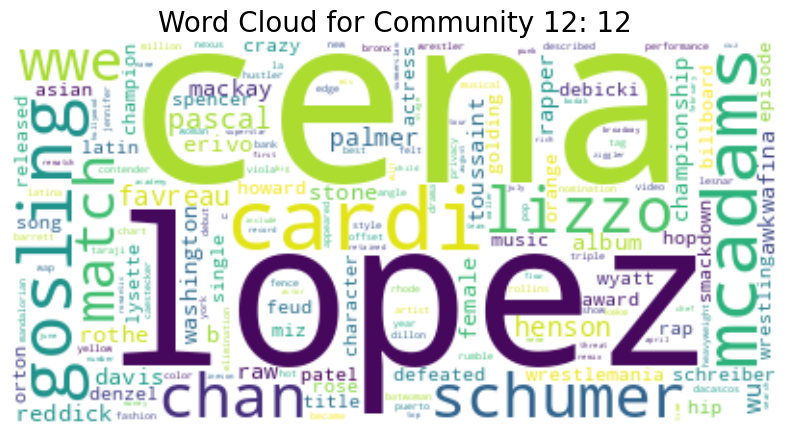

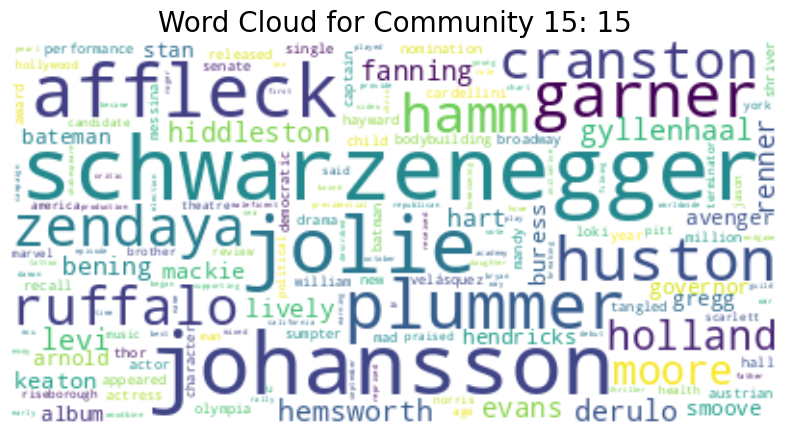

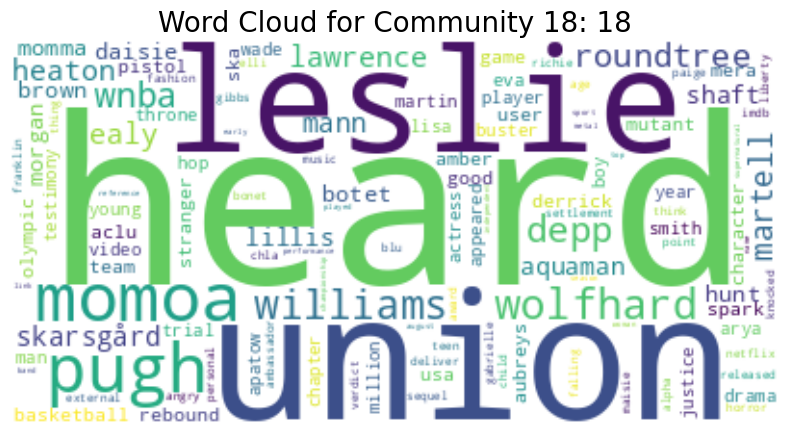

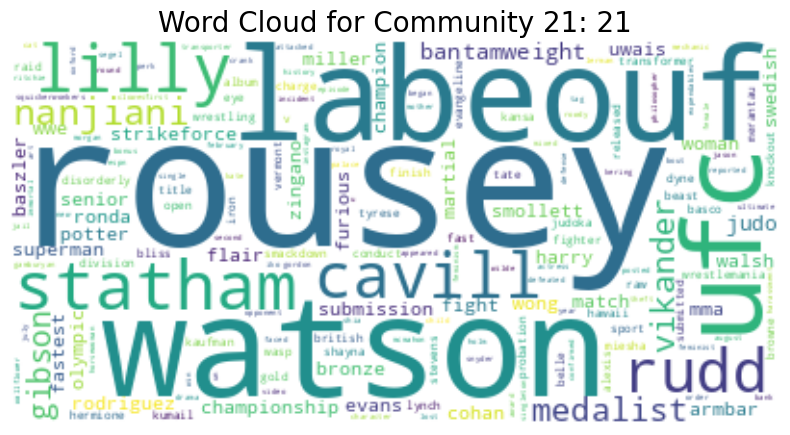

In [ ]:
for comm, freq_dist in comm_tf_idf.items():
  if comm in biggest_communities:
    create_word_cloud(freq_dist, comm, f"Community {comm}")

***Communities Identified***
- 5: Hollywood Stars
- 7: Versatile Actors/Actresses (Some are singers, in film...)
- 9: black
- 15: superhero
- 18: female empowerment films
- 21: action movies like fast and furious, mission impossible

In [ ]:
biggest_communities

[5, 15, 7, 12, 3, 9, 0, 8, 18, 21]

## **Sentiment Analysis on Description Text**

In [ ]:
!pip install textblob nltk

In [ ]:
from textblob import TextBlob

# Iterate through nodes and perform sentiment analysis
for node, attr in G.nodes(data=True):
    description = attr.get('description', '')
    if description:  # Check if description exists
        sentiment = TextBlob(description).sentiment.polarity  # Polarity ranges from -1 to 1
        G.nodes[node]['sentiment'] = sentiment
    else:
        G.nodes[node]['sentiment'] = None  # No description available

for node, attr in G.nodes(data=True):
    sentiment = attr.get('sentiment', 0)  # Default to 0 if sentiment is missing
    if sentiment > 0.5:
        sentiment_category = 'strongly positive'
    elif sentiment > 0:
        sentiment_category = 'positive'
    elif sentiment >= -0.5:
        sentiment_category = 'negative'
    else:
        sentiment_category = 'strongly negative'

    # Update the node with the sentiment category
    G.nodes[node]['sentiment_category'] = sentiment_category

In [ ]:
from collections import Counter

sentiment_counts = Counter(attr.get('sentiment_category', 'unknown') for _, attr in G.nodes(data=True))
print("Sentiment Counts:", sentiment_counts)

Sentiment Counts: Counter({'positive': 468, 'negative': 16})


In [ ]:
positive_nodes = [node for node, attr in G.nodes(data=True) if attr.get('sentiment', 0) > 0]
negative_nodes = [node for node, attr in G.nodes(data=True) if attr.get('sentiment', 0) < 0]
print("Positive nodes:", positive_nodes)
print("Negative nodes:", negative_nodes)

Positive nodes: ['Brad Pitt', 'Helena Bonham Carter', 'Adam Brody', 'Kenneth Branagh', 'Daisy Ridley', 'Pierce Brosnan', 'Christine Baranski', 'Julie Walters', 'Amanda Seyfried', 'Sandra Bullock', 'Ryan Reynolds', 'Candice Bergen', 'Keanu Reeves', 'Jennifer Connelly', 'Russell Crowe', 'Anne Hathaway', 'Eddie Redmayne', 'Hugh Skinner', 'Joaquin Phoenix', 'Danny DeVito', 'Guy Pearce', 'Tom Cruise', 'Renée Zellweger', 'Jamie Lee Curtis', 'James Jude Courtney', 'Johnny Depp', 'Keira Knightley', 'Leonardo DiCaprio', 'Tom Hardy', 'Kathy Bates', 'Mark Wahlberg', 'Alec Baldwin', 'Matt Damon', 'Margot Robbie', 'Clint Eastwood', 'Morgan Freeman', 'Ralph Fiennes', 'Danny Huston', 'Jude Law', 'Liam Neeson', 'Colin Firth', 'Samuel L. Jackson', 'Taron Egerton', 'Harrison Ford', 'Anthony Daniels', 'Christian Bale', 'Michael Caine', 'Aaron Eckhart', 'Whoopi Goldberg', 'Oprah Winfrey', 'Salma Hayek', 'Will Smith', 'Bruce Willis', 'Ving Rhames', 'Jennifer Jason Leigh', 'Demián Bichir', 'Walton Goggins',

In [ ]:
for node, community in partition_louvain.items():
    G.nodes[node]['community'] = community

from collections import defaultdict

community_nodes = defaultdict(list)
for node, attr in G.nodes(data=True):
    community = attr.get('community')
    community_nodes[community].append(node)

In [ ]:
negative_sentiment_by_community = {}

for community, nodes in community_nodes.items():
    negative_count = sum(1 for node in nodes if G.nodes[node].get('sentiment', 0) < 0)
    total_nodes = len(nodes)
    negative_sentiment_by_community[community] = {
        "negative_count": negative_count,
        "total_nodes": total_nodes,
        "negative_ratio": negative_count / total_nodes if total_nodes > 0 else 0
    }

In [ ]:
for community, stats in negative_sentiment_by_community.items():
    print(f"Community {community}:")
    print(f"  Negative Nodes: {stats['negative_count']}")
    print(f"  Total Nodes: {stats['total_nodes']}")
    print(f"  Negative Sentiment Ratio: {stats['negative_ratio']:.2f}")

Community 3:
  Negative Nodes: 0
  Total Nodes: 40
  Negative Sentiment Ratio: 0.00
Community 1:
  Negative Nodes: 1
  Total Nodes: 11
  Negative Sentiment Ratio: 0.09
Community 2:
  Negative Nodes: 0
  Total Nodes: 15
  Negative Sentiment Ratio: 0.00
Community 11:
  Negative Nodes: 1
  Total Nodes: 32
  Negative Sentiment Ratio: 0.03
Community 5:
  Negative Nodes: 0
  Total Nodes: 16
  Negative Sentiment Ratio: 0.00
Community 24:
  Negative Nodes: 1
  Total Nodes: 15
  Negative Sentiment Ratio: 0.07
Community 10:
  Negative Nodes: 0
  Total Nodes: 3
  Negative Sentiment Ratio: 0.00
Community 19:
  Negative Nodes: 0
  Total Nodes: 29
  Negative Sentiment Ratio: 0.00
Community 8:
  Negative Nodes: 1
  Total Nodes: 33
  Negative Sentiment Ratio: 0.03
Community 21:
  Negative Nodes: 1
  Total Nodes: 36
  Negative Sentiment Ratio: 0.03
Community 16:
  Negative Nodes: 0
  Total Nodes: 2
  Negative Sentiment Ratio: 0.00
Community 27:
  Negative Nodes: 0
  Total Nodes: 32
  Negative Sentiment

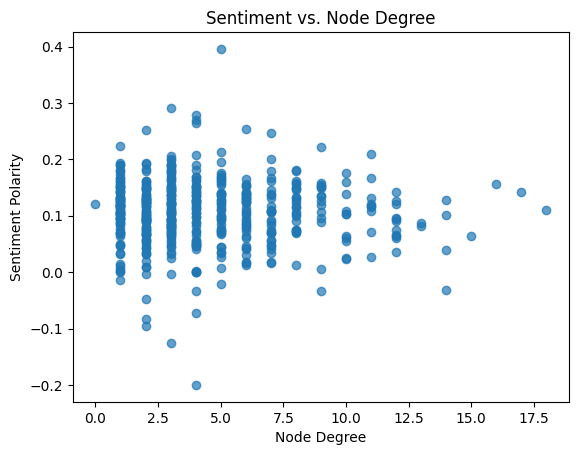

In [ ]:
import matplotlib.pyplot as plt

# Extract sentiment and degree
node_sentiments = [
    (attr.get('sentiment', 0), G.degree(node)) for node, attr in G.nodes(data=True)
]

# Scatter plot of sentiment vs. degree
sentiments, degrees = zip(*node_sentiments)
plt.scatter(degrees, sentiments, alpha=0.7)
plt.title("Sentiment vs. Node Degree")
plt.xlabel("Node Degree")
plt.ylabel("Sentiment Polarity")
plt.show()

# **Discussion and Further Findings**

**Influence of Hubs on Collaboration Dynamics**

Observation: A small number of highly connected actors dominate the network (scale-free property).

Potential Finding: Test if these “hub” actors play a critical role in bridging otherwise disconnected communities.

Further Analysis:
- Calculate betweenness centrality to identify bridge nodes and test if removing them fragments the network.


In [ ]:
betweenness_centrality = nx.betweenness_centrality(G)

# Sort nodes by betweenness centrality
sorted_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Top 10 nodes with the highest betweenness centrality
top_hubs = sorted_betweenness[:10]
print("Top Hubs (Nodes with Highest Betweenness Centrality):", top_hubs)

Top Hubs (Nodes with Highest Betweenness Centrality): [('Sterling K. Brown', 0.08097605162686318), ('Chadwick Boseman', 0.07356636570974558), ('Dave Bautista', 0.0680222270595382), ("Lupita Nyong'o", 0.06095301275605418), ('Chris Evans', 0.04834850668265662), ('Jeremy Renner', 0.04622030611854433), ('John C. Reilly', 0.042980969299150164), ('Chris Pratt', 0.039067660958186076), ('Alfie Allen', 0.03878422147965817), ('Hannah John-Kamen', 0.038098272977304726)]


Original LCC size: 439


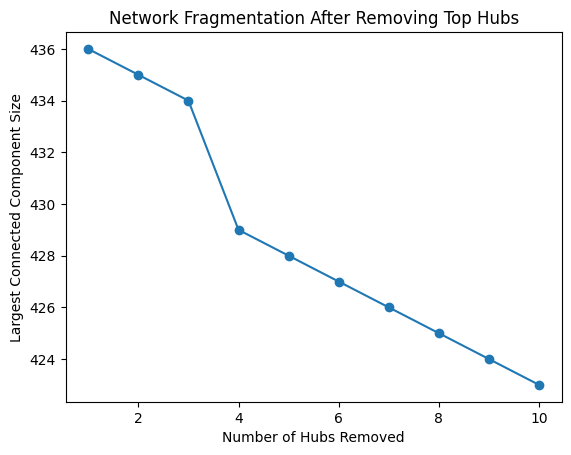

In [ ]:
import matplotlib.pyplot as plt

# Original largest connected component size
original_lcc = len(max(nx.connected_components(G), key=len))
print(f"Original LCC size: {original_lcc}")

# Sequentially remove top hubs and assess network fragmentation
lcc_sizes = []
G_temp = G.copy()
for hub, _ in top_hubs:
    G_temp.remove_node(hub)
    lcc_size = len(max(nx.connected_components(G_temp), key=len))
    lcc_sizes.append(lcc_size)

# Plot the fragmentation
plt.plot(range(1, len(top_hubs)+1), lcc_sizes, marker='o')
plt.title("Network Fragmentation After Removing Top Hubs")
plt.xlabel("Number of Hubs Removed")
plt.ylabel("Largest Connected Component Size")
plt.show()

<ipython-input-13-729a41d4fa81>:5: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  random_nodes = random.sample(G.nodes(), len(top_hubs))


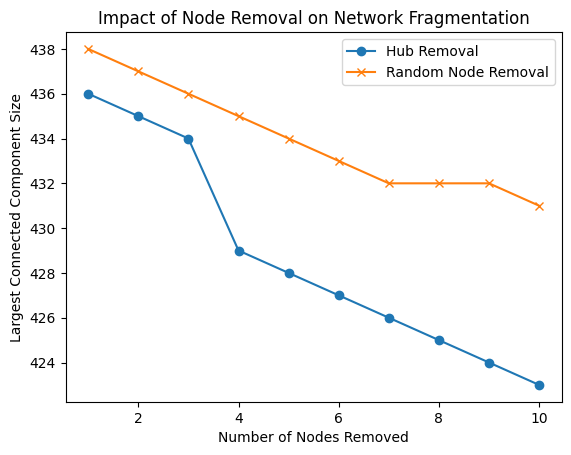

In [ ]:
import random

random_lcc_sizes = []
G_random_temp = G.copy()
random_nodes = random.sample(G.nodes(), len(top_hubs))
for node in random_nodes:
    G_random_temp.remove_node(node)
    lcc_size = len(max(nx.connected_components(G_random_temp), key=len))
    random_lcc_sizes.append(lcc_size)

# Plot comparison
plt.plot(range(1, len(top_hubs)+1), lcc_sizes, marker='o', label='Hub Removal')
plt.plot(range(1, len(top_hubs)+1), random_lcc_sizes, marker='x', label='Random Node Removal')
plt.title("Impact of Node Removal on Network Fragmentation")
plt.xlabel("Number of Nodes Removed")
plt.ylabel("Largest Connected Component Size")
plt.legend()
plt.show()

**Role of Sentiment in Actor Descriptions**

Observation: Sentiment analysis reveals predominantly positive sentiment, with a few communities exhibiting more negativity.

Potential Finding: Test whether sentiment polarity correlates with centrality measures

Further Analysis:
- Investigate how sentiment polarity varies across genres or communities.

Correlation between Sentiment Polarity and Degree Centrality: -0.02
Correlation between Sentiment Polarity and Betweenness Centrality: -0.03


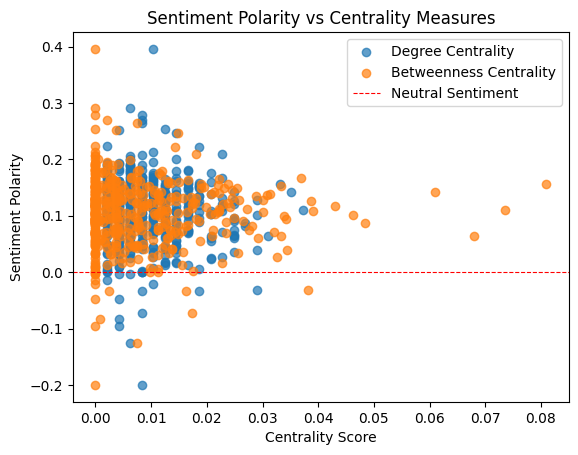

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)

# Create lists of sentiment and centrality measures for correlation
sentiment_scores = [G.nodes[node]['sentiment'] for node in G.nodes()]
degree_scores = [degree_centrality[node] for node in G.nodes()]
betweenness_scores = [betweenness_centrality[node] for node in G.nodes()]

# Calculate correlations
degree_corr = np.corrcoef(sentiment_scores, degree_scores)[0, 1]
betweenness_corr = np.corrcoef(sentiment_scores, betweenness_scores)[0, 1]

print(f"Correlation between Sentiment Polarity and Degree Centrality: {degree_corr:.2f}")
print(f"Correlation between Sentiment Polarity and Betweenness Centrality: {betweenness_corr:.2f}")

# Scatter plot
plt.scatter(degree_scores, sentiment_scores, alpha=0.7, label='Degree Centrality')
plt.scatter(betweenness_scores, sentiment_scores, alpha=0.7, label='Betweenness Centrality')
plt.axhline(0, color='red', linestyle='--', linewidth=0.8, label="Neutral Sentiment")
plt.title("Sentiment Polarity vs Centrality Measures")
plt.xlabel("Centrality Score")
plt.ylabel("Sentiment Polarity")
plt.legend()
plt.show()

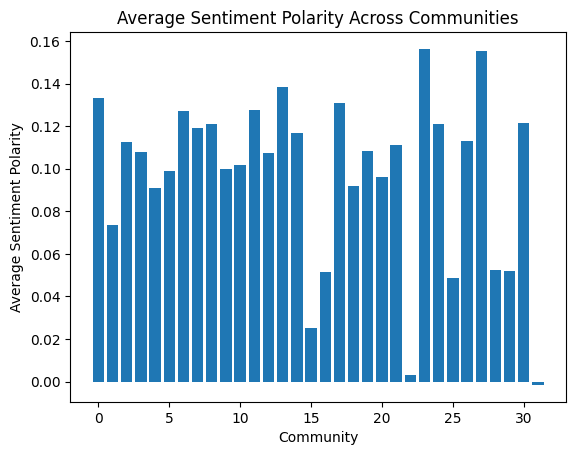

In [ ]:
from collections import defaultdict
from community import community_louvain

# Community detection
communities = community_louvain.best_partition(G)

# Group sentiment scores by community
community_sentiments = defaultdict(list)

for node in G.nodes():
    community_id = communities[node]
    sentiment = G.nodes[node]['sentiment']
    community_sentiments[community_id].append(sentiment)

# Calculate average sentiment per community
average_sentiments = {k: np.mean(v) for k, v in community_sentiments.items()}

# Plot sentiment across communities
plt.bar(average_sentiments.keys(), average_sentiments.values())
plt.title("Average Sentiment Polarity Across Communities")
plt.xlabel("Community")
plt.ylabel("Average Sentiment Polarity")
plt.show()